In [1]:
import pandas as pd
import numpy as np
from sklearn import preprocessing
import matplotlib.pyplot as plt
plt.rc("font", size = 14)
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import seaborn as sns
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)



In [19]:
# !conda install SMOTE

In [2]:
data = pd.read_csv('F:/ML Data Files/dataNIFTY.csv')

In [3]:
data.head()

,DATE,TIME,OPEN,HIGH,LOW,CLOSE,BollUp1,Boll1,BollDown1,BollUp2,...,Signal,Histogram,RSI,%K,%D,ADX,ADXR,HistoricalVolatility,Returns,Target
0,17-Aug-18,15:29:00,11466.80,11468.95,11463.70,11465.55,11479.87,11468.03,11456.19,11478.18,...,-2.65,0.16,39.42,41.16,38.26,20.15,18.40,0.24,,NaN
1,17-Aug-18,15:28:00,11467.45,11469.35,11466.10,11466.10,11481.57,11468.56,11455.55,11479.71,...,-2.69,0.16,40.46,38.17,36.75,20.59,17.86,0.25,4.80E-05,1.0
2,17-Aug-18,15:27:00,11466.05,11467.80,11465.50,11467.45,11483.31,11469.10,11454.90,11481.28,...,-2.73,0.13,43.05,41.52,35.72,22.06,18.20,0.25,0.000117731,1.0
3,17-Aug-18,15:26:00,11468.05,11468.05,11465.60,11466.00,11484.40,11469.51,11454.62,11482.27,...,-2.76,-0.04,39.17,37.11,33.58,22.87,18.71,0.24,-0.000126453,0.0
4,17-Aug-18,15:25:00,11466.10,11468.45,11465.25,11467.75,11485.52,11470.05,11454.57,11483.31,...,-2.75,-0.10,42.41,33.35,29.91,23.78,19.04,0.24,0.000152614,1.0


C:\Users\SUNEEL\Anaconda3\lib\site-packages\numpy\lib\histograms.py:746: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\SUNEEL\Anaconda3\lib\site-packages\numpy\lib\histograms.py:747: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


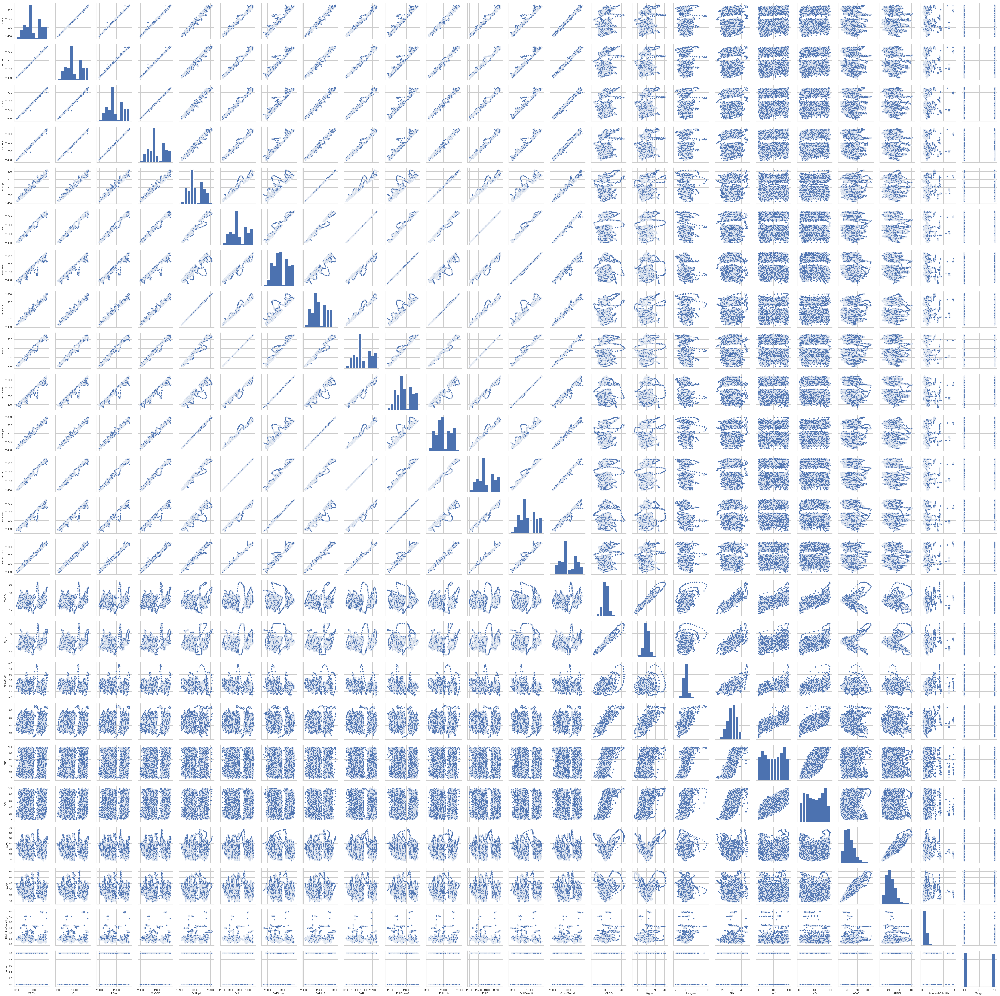

In [4]:
sns.pairplot(data);

In [4]:
print(data.shape)
print(list(data.columns))

(6000, 27)
['DATE', 'TIME', 'OPEN', 'HIGH', 'LOW', 'CLOSE', 'BollUp1', 'Boll1', 'BollDown1', 'BollUp2', 'Boll2', 'BollDown2', 'BollUp3', 'Boll3', 'BollDown3', 'SuperTrend', 'MACD', 'Signal', 'Histogram', 'RSI', '%K', '%D', 'ADX', 'ADXR', 'HistoricalVolatility', 'Returns', 'Target']


In [5]:
data = data.dropna()

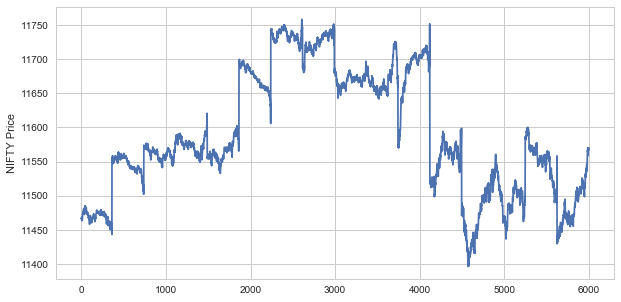

In [6]:
data['CLOSE'].plot(figsize=(10,5))

plt.ylabel("NIFTY Price")

plt.show()

In [7]:
data['Target'].value_counts()

0.0    3050
1.0    2949
Name: Target, dtype: int64

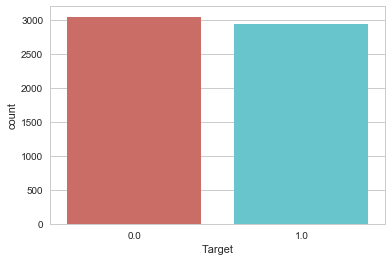

<Figure size 432x288 with 0 Axes>

In [8]:
sns.countplot(x='Target', data= data, palette = 'hls')
plt.show()
plt.savefig('count_plot')

In [9]:
 
X = data.loc[:, data.columns != 'Target']
X = X.iloc[:, 2:-1]

y = data.loc[:, data.columns == 'Target']



#os = SMOTE(random_state = 0)
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state=0)

print(X.head())

print(y.head())

print("shape of X_train", X_train.shape)
print("shape of y_train", y_train.shape)
print("shape of X_test", X_test.shape)
print("shape of y_test", y_test.shape)


       OPEN      HIGH       LOW     CLOSE   BollUp1     Boll1  BollDown1  \
1  11467.45  11469.35  11466.10  11466.10  11481.57  11468.56   11455.55   
2  11466.05  11467.80  11465.50  11467.45  11483.31  11469.10   11454.90   
3  11468.05  11468.05  11465.60  11466.00  11484.40  11469.51   11454.62   
4  11466.10  11468.45  11465.25  11467.75  11485.52  11470.05   11454.57   
5  11464.80  11466.35  11464.70  11466.15  11487.09  11470.58   11454.08   

    BollUp2     Boll2  BollDown2          ...           SuperTrend  MACD  \
1  11479.71  11468.56   11457.41          ...             11471.75 -2.53   
2  11481.28  11469.10   11456.92          ...             11471.75 -2.61   
3  11482.27  11469.51   11456.75          ...             11471.75 -2.80   
4  11483.31  11470.05   11456.78          ...             11471.75 -2.86   
5  11484.73  11470.58   11456.44          ...             11471.75 -3.07   

   Signal  Histogram    RSI     %K     %D    ADX   ADXR  HistoricalVolatility  
1   -2

In [95]:
datanew = pd.concat([X,y],1)
datanew = datanew.dropna()

print(datanew.head())
print(datanew.tail())


       OPEN      HIGH       LOW     CLOSE   BollUp1     Boll1  BollDown1  \
1  11467.45  11469.35  11466.10  11466.10  11481.57  11468.56   11455.55   
2  11466.05  11467.80  11465.50  11467.45  11483.31  11469.10   11454.90   
3  11468.05  11468.05  11465.60  11466.00  11484.40  11469.51   11454.62   
4  11466.10  11468.45  11465.25  11467.75  11485.52  11470.05   11454.57   
5  11464.80  11466.35  11464.70  11466.15  11487.09  11470.58   11454.08   

    BollUp2     Boll2  BollDown2   ...    MACD  Signal  Histogram    RSI  \
1  11479.71  11468.56   11457.41   ...   -2.53   -2.69       0.16  40.46   
2  11481.28  11469.10   11456.92   ...   -2.61   -2.73       0.13  43.05   
3  11482.27  11469.51   11456.75   ...   -2.80   -2.76      -0.04  39.17   
4  11483.31  11470.05   11456.78   ...   -2.86   -2.75      -0.10  42.41   
5  11484.73  11470.58   11456.44   ...   -3.07   -2.73      -0.34  38.06   

      %K     %D    ADX   ADXR  HistoricalVolatility  Target  
1  38.17  36.75  20.59  

In [10]:
# print(X.dtypes), print(y.dtypes), 
print(" ", X_train.dtypes) 
print(" ", X_test.dtypes)
print(" ", y_train.dtypes)
print(" ", y_test.dtypes)

  OPEN                    float64
HIGH                    float64
LOW                     float64
CLOSE                   float64
BollUp1                 float64
Boll1                   float64
BollDown1               float64
BollUp2                 float64
Boll2                   float64
BollDown2               float64
BollUp3                 float64
Boll3                   float64
BollDown3               float64
SuperTrend              float64
MACD                    float64
Signal                  float64
Histogram               float64
RSI                     float64
%K                      float64
%D                      float64
ADX                     float64
ADXR                    float64
HistoricalVolatility    float64
dtype: object
  OPEN                    float64
HIGH                    float64
LOW                     float64
CLOSE                   float64
BollUp1                 float64
Boll1                   float64
BollDown1               float64
BollUp2               

# Recursive Feature Elimination(RFE)
is based on the idea to repeatedly construct a model and choose either the best or worst performing feature, setting the feature aside and then repeating the process with the rest of the features. This process is applied until all features in the dataset are exhausted. The goal of RFE is to select features by recursively considering smaller and smaller sets of features.


In [11]:
#data_vars = data.columns.values.tolist()
#y = ['y']
#X = [i for i in data_vars if i not in y]

from sklearn.linear_model import LogisticRegression
from sklearn import metrics

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

logreg = LogisticRegression()
logreg.fit(X_train, y_train)

C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\utils\validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [12]:
# Predicting the test set rsults and calculating the accuracy
y_pred = logreg.predict(X_test)
print(y_pred)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

[1. 1. 1. ... 0. 1. 0.]
Accuracy of logistic regression classifier on test set: 0.52


In [13]:
logreg.score(X_train, y_train)

0.5491783758037628

In [ ]:
# Logistic Regression has predicted with 52% accuracy 

In [14]:

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve


In [15]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

[[528 378]
 [480 414]]


In [101]:
# The results are telling us that we have 526+412 correct predictions and 482+380 incorrect predictions 

# Compute precision, recall, F-measure and support

The precision is the ratio tp / (tp + fp) where tp is the number of true positives and fp the number of false positives. The precision is intuitively the ability of the classifier to not label a sample as positive if it is negative.

The recall is the ratio tp / (tp + fn) where tp is the number of true positives and fn the number of false negatives. The recall is intuitively the ability of the classifier to find all the positive samples.

The F-beta score can be interpreted as a weighted harmonic mean of the precision and recall, where an F-beta score reaches its best value at 1 and worst score at 0.

The F-beta score weights the recall more than the precision by a factor of beta. beta = 1.0 means recall and precision are equally important.

The support is the number of occurrences of each class in y_test.

In [16]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.52      0.58      0.55       906
         1.0       0.52      0.46      0.49       894

   micro avg       0.52      0.52      0.52      1800
   macro avg       0.52      0.52      0.52      1800
weighted avg       0.52      0.52      0.52      1800



In [ ]:
# ROC Curve

In [17]:
logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])

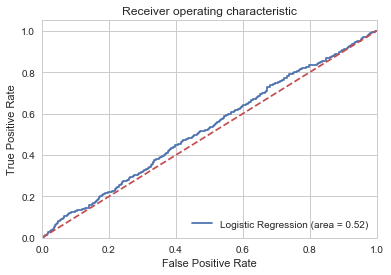

In [18]:
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [105]:
# Support Vecto Machines

In [19]:
from sklearn.svm import SVC
cls = SVC(C=0.100, kernel='linear',gamma='scale',probability=True)
mod = cls.fit(X_train, y_train)

C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\utils\validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [20]:
from sklearn.metrics import accuracy_score

accuracy_train = accuracy_score(y_train, cls.predict(X_train))

accuracy_test = accuracy_score(y_test, cls.predict(X_test))

In [21]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, cls.predict(X_test))
print(confusion_matrix)

[[622 284]
 [580 314]]


In [22]:
y_pred = cls.predict(X_test)
print(y_pred)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(cls.score(X_test, y_test)))

[1. 0. 1. ... 0. 1. 0.]
Accuracy of logistic regression classifier on test set: 0.52


In [23]:
prob = mod.predict_proba(X_test)

In [24]:
from sklearn.metrics import roc_curve, auc

# Compute ROC curve and area the curve
fpr, tpr, thresholds = roc_curve(y_test, prob[:, 1])
roc_auc = auc(fpr, tpr)
print("Area under the ROC curve : %f" % roc_auc)


Area under the ROC curve : 0.529107


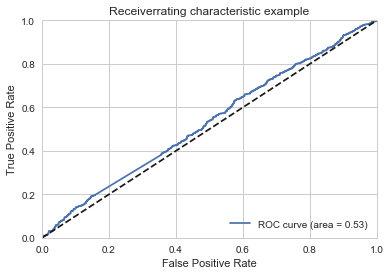

In [52]:
# Plot ROC curve
plt.clf()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiverrating characteristic example')
plt.legend(loc="lower right")
plt.show()

In [25]:

from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.52      0.69      0.59       906
         1.0       0.53      0.35      0.42       894

   micro avg       0.52      0.52      0.52      1800
   macro avg       0.52      0.52      0.51      1800
weighted avg       0.52      0.52      0.51      1800



In [27]:
# Decision Trees
from sklearn.tree import DecisionTreeClassifier

In [28]:
#clf_gini = DecisionTreeClassifier(criterion="gini", random_state=10, max_depth=3, min_samples_leaf=5)
clf_gini = DecisionTreeClassifier(criterion="gini", random_state=100)
dt = clf_gini.fit(X_train, y_train)



In [29]:
y_pred = dt.predict(X_test)

In [30]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, y_pred)

array([[456, 450],
       [440, 454]], dtype=int64)

In [31]:
accuracy_score(y_test, y_pred)

0.5055555555555555

In [32]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.51      0.50      0.51       906
         1.0       0.50      0.51      0.51       894

   micro avg       0.51      0.51      0.51      1800
   macro avg       0.51      0.51      0.51      1800
weighted avg       0.51      0.51      0.51      1800



In [72]:
# ROC Curve

In [33]:
prob = dt.predict_proba(X_test)

In [34]:
from sklearn.metrics import roc_curve, auc

# Compute ROC curve and area the curve
fpr, tpr, thresholds = roc_curve(y_test, prob[:, 1])
roc_auc = auc(fpr, tpr)
print("Area under the ROC curve : %f" % roc_auc)


Area under the ROC curve : 0.505571


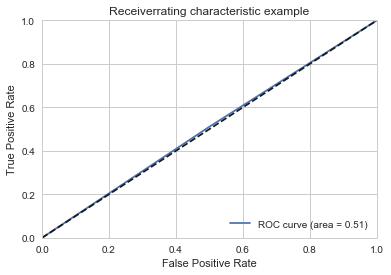

In [76]:
# Plot ROC curve
plt.clf()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiverrating characteristic example')
plt.legend(loc="lower right")
plt.show()

In [35]:
'''from sklearn.externals.six import StringIO  
from IPython.display import Image  
# from sklearn.tree import export_graphviz
import graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(dt, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())
   '''


'from sklearn.externals.six import StringIO  \nfrom IPython.display import Image  \n# from sklearn.tree import export_graphviz\nimport graphviz\nimport pydotplus\ndot_data = StringIO()\nexport_graphviz(dt, out_file=dot_data,  \n                filled=True, rounded=True,\n                special_characters=True)\ngraph = pydotplus.graph_from_dot_data(dot_data.getvalue())  \nImage(graph.create_png())\n   '

In [36]:
from sklearn.datasets import load_iris
from sklearn import tree
import graphviz 


In [37]:
X.columns

Index(['OPEN', 'HIGH', 'LOW', 'CLOSE', 'BollUp1', 'Boll1', 'BollDown1',
       'BollUp2', 'Boll2', 'BollDown2', 'BollUp3', 'Boll3', 'BollDown3',
       'SuperTrend', 'MACD', 'Signal', 'Histogram', 'RSI', '%K', '%D', 'ADX',
       'ADXR', 'HistoricalVolatility'],
      dtype='object')

In [38]:
'''
dt1 = ()
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X, y)

dot_data = tree.export_graphviz(clf, out_file=None, feature_names=X.columns,class_names=y.columns)                                             
graph = graphviz.Source(dot_data)  
#this will create an iris.pdf file with the rule path
graph.render("datanew")'''


'\ndt1 = ()\nclf = tree.DecisionTreeClassifier()\nclf = clf.fit(X, y)\n\ndot_data = tree.export_graphviz(clf, out_file=None, feature_names=X.columns,class_names=y.columns)                                             \ngraph = graphviz.Source(dot_data)  \n#this will create an iris.pdf file with the rule path\ngraph.render("datanew")'

In [39]:
n_nodes = dt.tree_.node_count
children_left = dt.tree_.children_left
children_right = dt.tree_.children_right
feature = dt.tree_.feature
threshold = dt.tree_.threshold

# The tree structure can be traversed to compute various properties such
# as the depth of each node and whether or not it is a leaf.
node_depth = np.zeros(shape=n_nodes, dtype=np.int64)
is_leaves = np.zeros(shape=n_nodes, dtype=bool)
stack = [(0, -1)]  # seed is the root node id and its parent depth
while len(stack) > 0:
    node_id, parent_depth = stack.pop()
    node_depth[node_id] = parent_depth + 1

    # If we have a test node
    if (children_left[node_id] != children_right[node_id]):
        stack.append((children_left[node_id], parent_depth + 1))
        stack.append((children_right[node_id], parent_depth + 1))
    else:
        is_leaves[node_id] = True

print("The binary tree structure has %s nodes and has "
      "the following tree structure:"
      % n_nodes)
for i in range(n_nodes):
    if is_leaves[i]:
        print("%snode=%s leaf node." % (node_depth[i] * "\t", i))
    else:
        print("%snode=%s test node: go to node %s if X[:, %s] <= %s else to "
              "node %s."
              % (node_depth[i] * "\t",
                 i,
                 children_left[i],
                 feature[i],
                 threshold[i],
                 children_right[i],
                 ))
print()

# First let's retrieve the decision path of each sample. The decision_path
# method allows to retrieve the node indicator functions. A non zero element of
# indicator matrix at the position (i, j) indicates that the sample i goes
# through the node j.

node_indicator = dt.decision_path(X_test)

# Similarly, we can also have the leaves ids reached by each sample.

leave_id = dt.apply(X_test)

# Now, it's possible to get the tests that were used to predict a sample or
# a group of samples. First, let's make it for the sample.

# HERE IS WHAT YOU WANT
sample_id = 0
node_index = node_indicator.indices[node_indicator.indptr[sample_id]:
                                    node_indicator.indptr[sample_id + 1]]

print('Rules used to predict sample %s: ' % sample_id)

for node_id in node_index:
    if leave_id[sample_id] == node_id:  # <-- changed != to ==
        #continue # <-- comment out
        print("leaf node {} reached, no decision here".format(leave_id[sample_id])) # <--

    else: # < -- added else to iterate through decision nodes
        if (X_test[sample_id, feature[node_id]] <= threshold[node_id]):
            threshold_sign = "<="
        else:
            threshold_sign = ">"

        print("decision id node %s : (X[%s, %s] (= %s) %s %s)"
              % (node_id,
                 sample_id,
                 feature[node_id],
                 X_test[sample_id, feature[node_id]], # <-- changed i to sample_id
                 threshold_sign,
                 threshold[node_id]))


The binary tree structure has 1933 nodes and has the following tree structure:
node=0 test node: go to node 1 if X[:, 7] <= 11478.93994140625 else to node 158.
	node=1 test node: go to node 2 if X[:, 4] <= 11478.81982421875 else to node 145.
		node=2 test node: go to node 3 if X[:, 16] <= -0.5450000166893005 else to node 40.
			node=3 test node: go to node 4 if X[:, 20] <= 33.795000076293945 else to node 27.
				node=4 test node: go to node 5 if X[:, 6] <= 11412.39501953125 else to node 6.
					node=5 leaf node.
					node=6 test node: go to node 7 if X[:, 8] <= 11447.26513671875 else to node 16.
						node=7 test node: go to node 8 if X[:, 4] <= 11451.46484375 else to node 9.
							node=8 leaf node.
							node=9 test node: go to node 10 if X[:, 17] <= 37.755001068115234 else to node 15.
								node=10 test node: go to node 11 if X[:, 18] <= 7.879999876022339 else to node 12.
									node=11 leaf node.
									node=12 test node: go to node 13 if X[:, 22] <= 0.4449999928474426 else 

																											node=1203 test node: go to node 1204 if X[:, 18] <= 50.42499923706055 else to node 1227.
																												node=1204 test node: go to node 1205 if X[:, 20] <= 17.360000610351562 else to node 1206.
																													node=1205 leaf node.
																													node=1206 test node: go to node 1207 if X[:, 13] <= 11559.8447265625 else to node 1210.
																														node=1207 test node: go to node 1208 if X[:, 20] <= 33.900001525878906 else to node 1209.
																															node=1208 leaf node.
																															node=1209 leaf node.
																														node=1210 test node: go to node 1211 if X[:, 16] <= -0.17000000178813934 else to node 1226.
																															node=1211 test node: go to node 1212 if X[:, 18] <= 33.35999870300293 else to node 1217.
																																node=1212 test node: go to node 1213 if X[:, 17] <= 53.755001068115234 else to node 1216.
											

KeyError: (0, 7)

In [40]:
# XGBOOT Algorithm
from sklearn.ensemble import RandomForestClassifier
from sklearn import ensemble

import numpy as np
import matplotlib.pyplot as plt

from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_gaussian_quantiles

In [41]:
params = {'n_estimators': 500, 'max_depth':4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}

In [42]:
bdt = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), algorithm="SAMME", n_estimators=200)

bdt.fit(X_train, y_train)



C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\utils\validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


AdaBoostClassifier(algorithm='SAMME',
          base_estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=1,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
          learning_rate=1.0, n_estimators=200, random_state=None)

In [43]:
y_pred 

array([1., 1., 1., ..., 1., 1., 1.])

In [44]:
y_pred = bdt.predict(X_test)

In [45]:
accuracy_score(y_test, y_pred)

0.5244444444444445

In [77]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.52      0.73      0.61       906
         1.0       0.54      0.32      0.40       894

   micro avg       0.52      0.52      0.52      1800
   macro avg       0.53      0.52      0.50      1800
weighted avg       0.53      0.52      0.50      1800



In [46]:
prob = bdt.predict_proba(X_test)

In [47]:
from sklearn.metrics import roc_curve, auc

# Compute ROC curve and area the curve
fpr, tpr, thresholds = roc_curve(y_test, prob[:, 1])
roc_auc = auc(fpr, tpr)
print("Area under the ROC curve : %f" % roc_auc)

Area under the ROC curve : 0.531377


In [48]:
from sklearn.metrics import roc_curve, auc

# Compute ROC curve and area the curve
fpr, tpr, thresholds = roc_curve(y_test, prob[:, 1])
roc_auc = auc(fpr, tpr)
print("Area under the ROC curve : %f" % roc_auc)


Area under the ROC curve : 0.531377


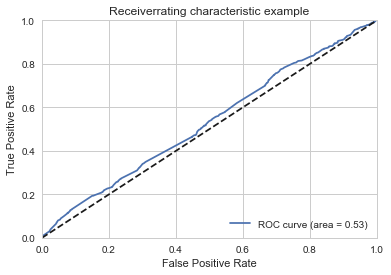

In [149]:
# Plot ROC curve
plt.clf()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiverrating characteristic example')
plt.legend(loc="lower right")
plt.show()

In [49]:
# Random Forest Classifier

from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier

In [50]:
clf = DecisionTreeClassifier(max_depth=None, min_samples_split=2,random_state=0)


In [51]:
score = cross_val_score(clf, X_train, y_train, cv=5)
score.mean()

0.503453090413758

In [156]:
clf = RandomForestClassifier(n_estimators=10, max_depth=None, min_samples_split=2, random_state=0)
scores = cross_val_score(clf, X_train, y_train, cv=5)
scores.mean()  

C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:528: DataConversionWarning: A column-vector 

0.5089329700891083

In [52]:
clf = ExtraTreesClassifier(n_estimators=10, max_depth=None, min_samples_split=2, random_state=0)
scores = cross_val_score(clf, X, y, cv=5)
scores.mean()

C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:528: DataConversionWarning: A column-vector 

0.4570810397553517

In [53]:
from sklearn.ensemble import GradientBoostingClassifier

clf = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0).fit(X_train, y_train)
clf.score(X_test, y_test)       

C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\utils\validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.515

In [54]:
feat_imp = clf.feature_importances_

In [55]:
print(feat_imp)

[0.         0.04748335 0.03082689 0.00912253 0.02689206 0.00548385
 0.03141847 0.03879542 0.01501595 0.0140983  0.04236458 0.00698417
 0.02482519 0.03340332 0.07062021 0.07455657 0.07900105 0.08886407
 0.05347012 0.05852533 0.0785309  0.05880801 0.11090967]


In [56]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier



In [57]:
clf1 = LogisticRegression(solver = 'lbfgs', random_state=1)

In [58]:
clf2 = RandomForestClassifier(n_estimators=50, random_state=1 )

In [59]:
clf3 = GaussianNB()

In [92]:
#from sklearn.svm import SVC
#clf4 = SVC(C=0.100, kernel='linear',gamma='scale',probability=True)

In [60]:
eclf = VotingClassifier(estimators=[('lr', clf1), ('rf', clf2), ('gnb', clf3)], voting="hard")

In [61]:
for clf, label in zip([clf1, clf2, clf3, eclf],['Logistic Regression', 'Random Forest', 'Naive Bayes', 'Ensemble']):
                                                
                                               scores = cross_val_score(clf, X_train,y_train, cv=5, scoring='accuracy')
                                               print("Accuracy: %0.2f (+/- %0.2f) [%s]" % (scores.mean(), scores.std(), label))

C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\utils\validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\utils\validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:757: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\utils\validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)

Accuracy: 0.51 (+/- 0.01) [Logistic Regression]


C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:528: DataConversionWarning: A column-vector 

Accuracy: 0.52 (+/- 0.01) [Random Forest]
Accuracy: 0.50 (+/- 0.01) [Naive Bayes]


C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\utils\validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\utils\validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\utils\validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\SUNEEL\Anaconda3\lib\site-packages\sklearn\utils\validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,

Accuracy: 0.52 (+/- 0.01) [Ensemble]
